In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

C:\Users\Vipra\anaconda3\envs\DS-Inno\Lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Vipra\anaconda3\envs\DS-Inno\Lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\Vipra\anaconda3\envs\DS-Inno\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
diamonds= pd.read_csv("diamonds.csv")

In [3]:
diamonds

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...,...
53935,53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


#### Removing the unnecessary column

In [5]:
diamonds.drop('Unnamed: 0',axis=1,inplace=True)

In [7]:
diamonds.duplicated().sum()

146

In [8]:
diamonds.drop_duplicates(inplace=True)

In [9]:
diamonds = diamonds.reset_index(drop=True)

#### EDA

In [10]:
# Set Seaborn style
sns.set(style="whitegrid")

##### Univariate histogram,barplot and pieplot

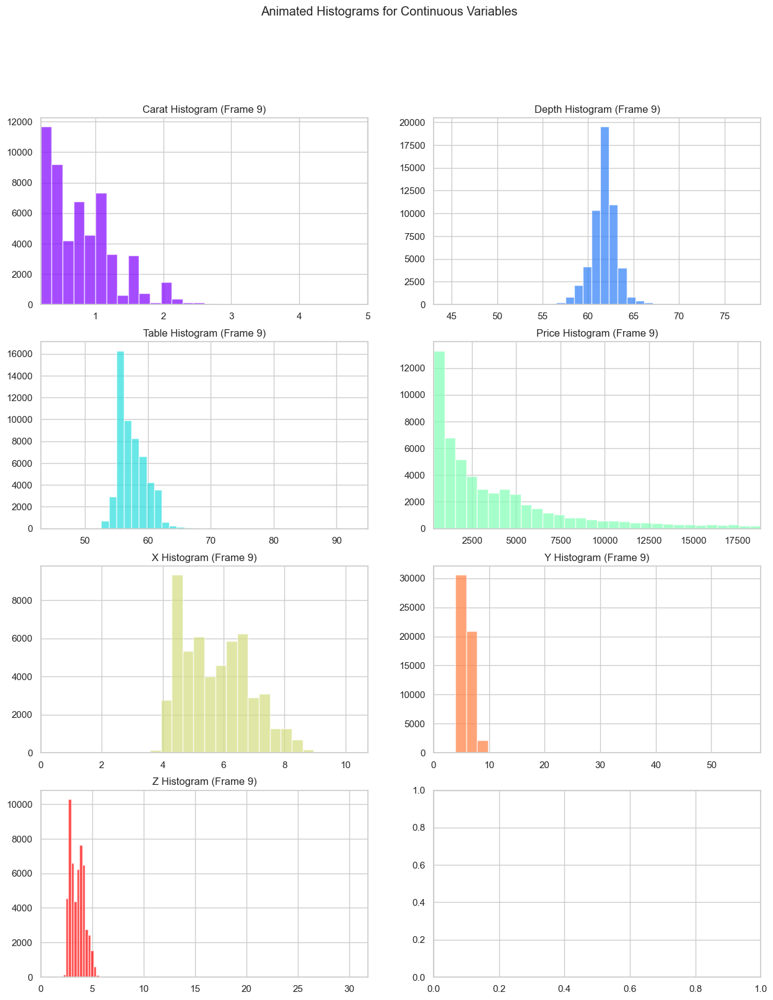

In [11]:

# List of continuous variable columns
continuous_columns = ["carat", "depth", "table", "price", "x", "y", "z"]

# Calculate the number of rows and columns for subplots
num_cols = 2  # Number of columns in the subplot grid
num_rows = int(np.ceil(len(continuous_columns) / num_cols))  # Calculate the number of rows

# Create a figure and axis for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 18))
fig.suptitle("Animated Histograms for Continuous Variables")

# Define colors for each column
colors = plt.cm.rainbow(np.linspace(0, 1, len(continuous_columns)))

# Create initial empty histograms for each column with different colors
histograms = [ax.hist([], bins=30, alpha=0.7, color=colors[i])[0] for i, ax in enumerate(axes.flat) if i < len(continuous_columns)]

# Update function for animation
def update(frame):
    for i, col in enumerate(continuous_columns):
        if i < len(axes.flat):
            ax = axes.flat[i]
            ax.clear()
            ax.set_title(f"{col.capitalize()} Histogram (Frame {frame})")
            ax.set_xlim(min(diamonds[col]), max(diamonds[col]))
            
            # Generate data for the current frame
            frame_data = np.random.choice(diamonds[col], size=len(diamonds))
            
            # Update the histogram
            n, bins, patches = ax.hist(frame_data, bins=30, alpha=0.7, color=colors[i])
            histograms[i] = patches
    
    return histograms

# Create the animation
animation = FuncAnimation(fig, update, frames=10, repeat=False,interval=500)

# Save the animation as a GIF
animation.save("animated_histograms_colored.gif", writer="pillow")

plt.show()


`From above histogram plots we can see that the data in the column is not normally distributed`

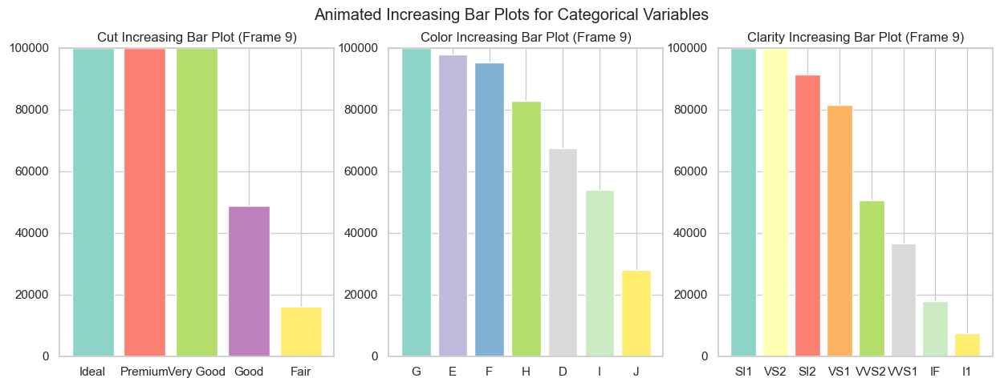

In [12]:
# List of categorical variable columns
categorical_columns = ["cut", "color", "clarity"]

# Create a figure and axis for the subplots
fig, axes = plt.subplots(1, len(categorical_columns), figsize=(15, 5))
fig.suptitle("Animated Increasing Bar Plots for Categorical Variables")

# Initialize y-axis limits
initial_y_limit = 0
max_y_limit = 100000

# Update function for animation
def update(frame):
    for i, col in enumerate(categorical_columns):
        ax = axes[i]
        ax.clear()
        ax.set_title(f"{col.capitalize()} Increasing Bar Plot (Frame {frame})")
        
        # Calculate the frequency of each category in the original data
        category_counts = diamonds[col].value_counts()
        
        # Get unique categories for the current variable
        categories = category_counts.index
        
        # Calculate new bar heights for the current frame
        new_heights = {category: (frame + 1) * count for category, count in zip(categories, category_counts)}
        
         # Generate a unique color for each bar
        bar_colors = plt.cm.Set3(np.linspace(0, 1, len(categories)))
        
        # Update bar heights for the current variable within y-axis limits
        bars = []
        for category,color in zip(categories,bar_colors):
            bar = ax.bar(category, min(new_heights[category], max_y_limit), color=color)
            bars.append(bar)
        
        # Set y-axis limits and tick locations
        ax.set_ylim(initial_y_limit, max_y_limit)
        ax.set_yticks(np.arange(initial_y_limit, max_y_limit + 1, 20000))
        ax.yaxis.grid(True)
        
    return bars

# Create the animation
animation = FuncAnimation(fig, update, frames=10, repeat=False,interval=500)

# Save the animation as a GIF
animation.save("animated_increasing_categorical_bar_plots.gif", writer="pillow")

plt.show()


`From above bargraph plots we can say that there are more diamonds with Ideal cut, 'G' grade color and 'SI1' grade clarity`

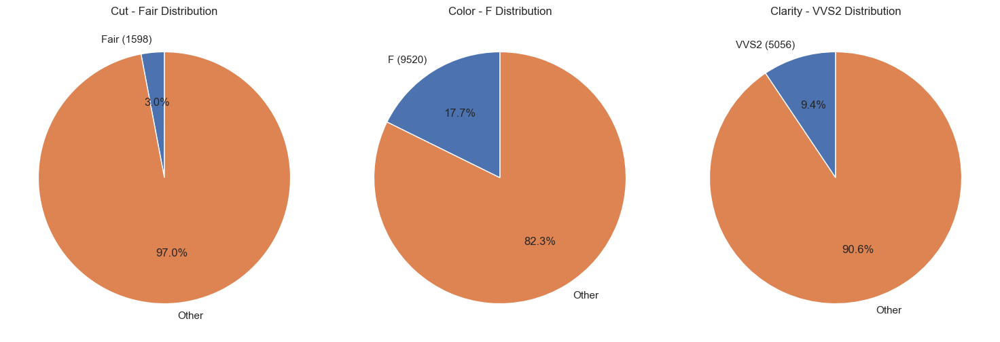

In [13]:
# Variables for which pie charts will be created
variables = ["cut", "color", "clarity"]

# Set up the figure and axis
fig, axs = plt.subplots(1, len(variables), figsize=(15, 5))

# Function to update the animation
def animate(frame):
    for i, variable in enumerate(variables):
        ax = axs[i]
        ax.clear()
        data = diamonds[diamonds[variable] == diamonds[variable].unique()[frame]]
        counts = data['price'].count()
        labels = data[variable].iloc[0]
        sizes = [counts, len(diamonds) - counts]
        ax.pie(sizes, labels=[f'{labels} ({counts})', 'Other'], autopct='%1.1f%%', startangle=90)
        ax.set_title(f'{variable.capitalize()} - {labels} Distribution')

# Create the animation
ani = FuncAnimation(fig, animate, frames=len(diamonds[variables[0]].unique()), interval=1000, repeat=False)
ani.save("Animated-pie-graphs.gif",writer = "pillow")
# Show the animation
plt.tight_layout()
plt.show()


`The animated pie chart shows the ratio of individual classes with the remaining in each feature`

##### Bivariate scatterplots and stacked barplots

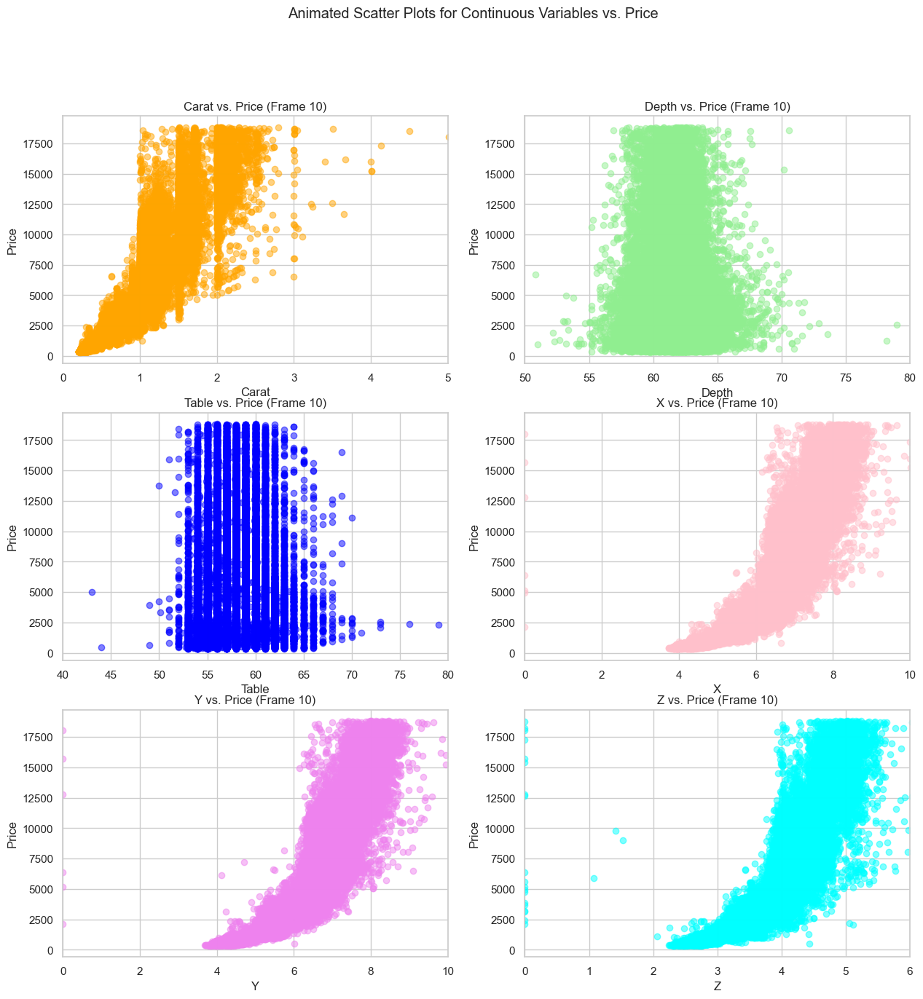

In [14]:
# List of continuous variable columns
continuous_columns = ["carat", "depth", "table", "x", "y", "z"]

# Create a figure and axis for the subplots
num_rows = len(continuous_columns) // 2 + len(continuous_columns) % 2
fig, axes = plt.subplots(num_rows, 2, figsize=(15, 5*num_rows))
fig.suptitle("Animated Scatter Plots for Continuous Variables vs. Price")

# Define colors for the scatter plots
colors = ['orange','lightgreen','blue','pink','violet','cyan']

# Set constant x-axis limits
x_limits = {
    "carat": (0, 5),
    "depth": (50, 80),
    "table": (40, 80),
    "x": (0, 10),
    "y": (0, 10),
    "z": (0, 6)
}

# Update function for animation
def update(frame):
    for i, col in enumerate(continuous_columns):
        row = i // 2
        column = i % 2
        ax = axes[row, column]
        ax.clear()
        ax.set_title(f"{col.capitalize()} vs. Price (Frame {frame+1})")
        ax.set_xlabel(col.capitalize())
        ax.set_ylabel("Price")
        
        # Calculate the number of data points to display for the current frame
        num_points = len(diamonds) * (frame + 1) // 10
        
        # Select data for the current frame
        sample_data = diamonds.sample(n=num_points)
        
        # Update scatter plot with different colors and constant x-axis limits
        ax.scatter(sample_data[col], sample_data["price"], color=colors[i], alpha=0.5)
        ax.set_xlim(x_limits[col])
    
    return axes

# Create the animation
animation = FuncAnimation(fig, update, frames=10, repeat=False,interval=500)

# Save the animation as a GIF
animation.save("animated_continuous_features_vs_price_scatter_plots_colored.gif", writer="pillow")

plt.show()


`The above scatter plots display a positive relationship between various features with Price. We observe the same kind of relationship in the heatmap using Pearson correlation coefficients further.`

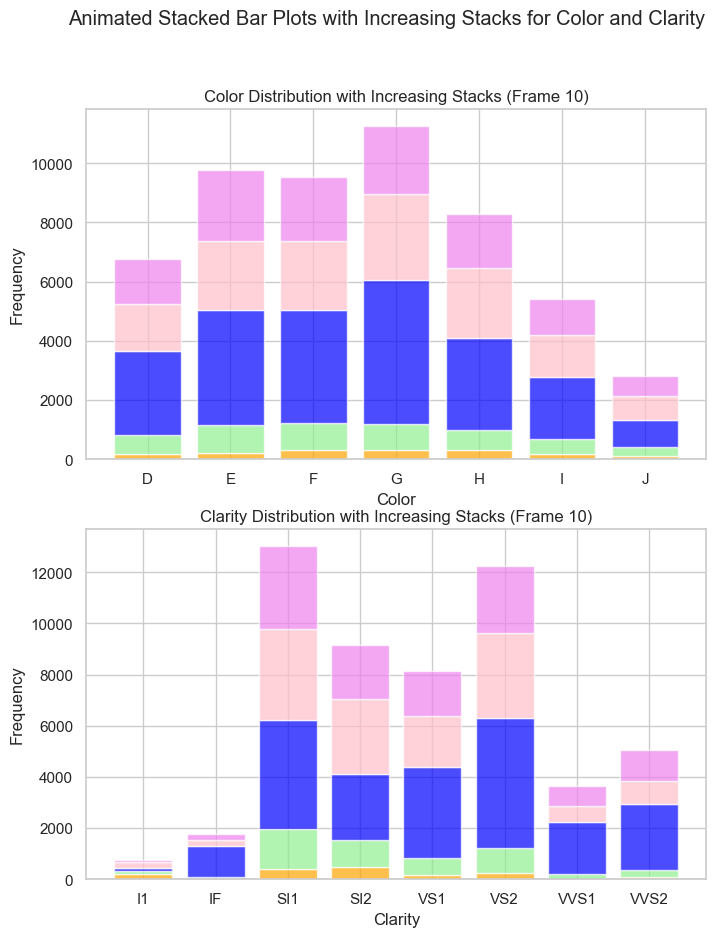

In [15]:
# List of categorical variable columns
categorical_columns = ["color", "clarity"]

# Create a figure and axis for the subplots
num_rows = len(categorical_columns)
fig, axes = plt.subplots(num_rows, 1, figsize=(8, 5*num_rows))
fig.suptitle("Animated Stacked Bar Plots with Increasing Stacks for Color and Clarity")

# Define colors for the stacked bar plots
colors = ['orange','lightgreen','blue','pink','violet','cyan','darkorchid','lightpink']


# Update function for animation
def update(frame):
    j=0
    for i, col in enumerate(categorical_columns):
        ax = axes[i]
        ax.clear()
        ax.set_title(f"{col.capitalize()} Distribution with Increasing Stacks (Frame {frame+1})")
        ax.set_xlabel(col.capitalize())
        ax.set_ylabel("Frequency")
        
        # Calculate the number of data points to display for the current frame
        num_points = len(diamonds) * (frame + 1) // 10
        
        # Select data for the current frame
        sample_data = diamonds.sample(n=num_points)
        
        # Create a stacked bar plot with increasing stacks
        cross_tab = pd.crosstab(sample_data["cut"], sample_data[col])
        bottom = None
        for index, row in cross_tab.iterrows():
            ax.bar(row.index, row.values, bottom=bottom, color=colors[j], alpha=0.7)
            if bottom is None:
                bottom = row.values
            else:
                bottom += row.values
            j+=1
        j=0
    return axes

# Create the animation with a 0.5 second delay between frames
animation = FuncAnimation(fig, update, frames=10, repeat=False, interval=500)

# Save the animation as a GIF
animation.save("animated_stacked_bar_graphs.gif", writer="pillow")

plt.show()


##### Multivariate scatterplot

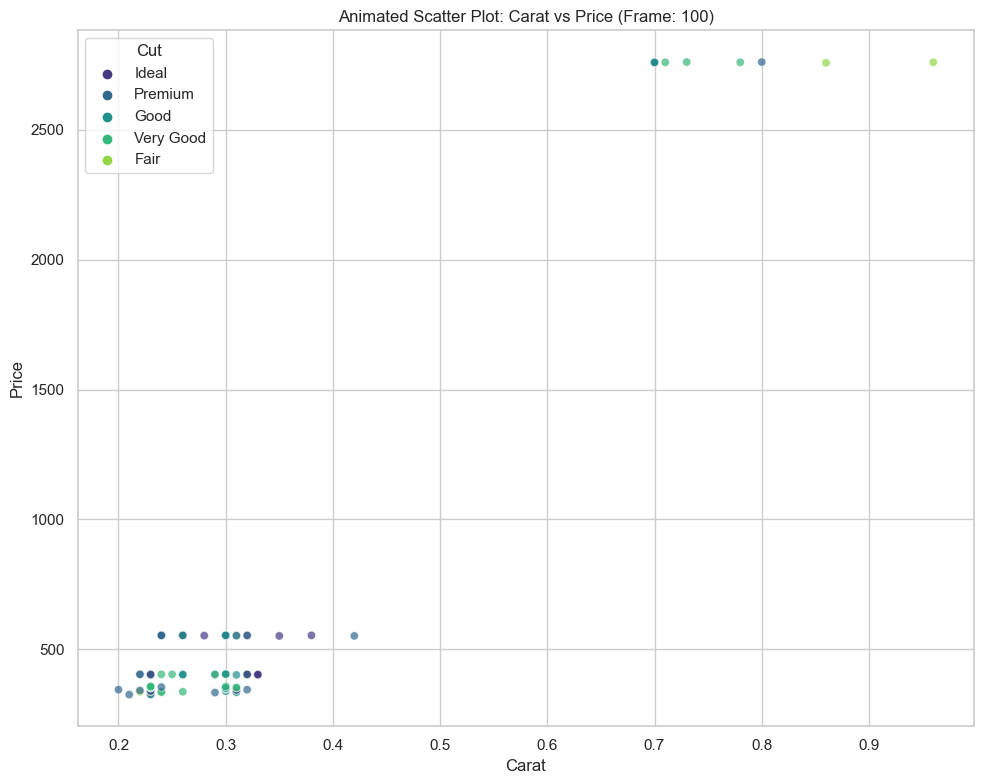

In [16]:

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Function to update the animation
def animate(frame):
    ax.clear()
    sns.scatterplot(data=diamonds.iloc[:frame + 1], x="carat", y="price", hue="cut", palette="viridis", alpha=0.7)
    ax.set_xlabel("Carat")
    ax.set_ylabel("Price")
    ax.set_title(f"Animated Scatter Plot: Carat vs Price (Frame: {frame + 1})")
    ax.legend(title="Cut")

# Create the animation
ani = FuncAnimation(fig, animate, frames=100, interval=100, repeat=False)
ani.save("Multivariate-analysis-carat-price-cut.gif",writer = "pillow")
# Show the animation
plt.tight_layout()
plt.show()

`The above scatter plot displays the multivariate analysis between carat and price with type of cut. Diamonds having highest prices have high carat value and fair-premium cut.`

### Analysis using plotly graphs

In [57]:
import plotly.express as px
# Scatter plot with color-coded hue (cut)
scatter = px.scatter(diamonds, x="carat", y="price", color="clarity", title="Scatter Plot: Carat vs Price with Hue (Clarity)")
scatter.show()

In [58]:
# Create an animated bubble chart
bubble_chart = px.scatter(diamonds, x="carat", y="price", size="carat",color = 'color',
                          title="Bubble Chart: Carat vs Price",
                          labels={"carat": "Carat", "price": "Price"},
                          range_x=[0, 5], range_y=[0, 20000],
                          size_max=30, template="plotly")
bubble_chart.show()


In [59]:
# Histogram of carat
hist = px.histogram(diamonds, x="price", nbins=50, title="Histogram: Price Distribution")
hist.show()




In [22]:
# Scatter plot matrix
scatter_matrix = px.scatter_matrix(diamonds, dimensions=["carat", "depth", "table", "price"],
                                   color="cut", title="Scatter Plot Matrix")
scatter_matrix.show()



In [60]:
# Calculate the correlation matrix
correlation_matrix = diamonds.corr()
correlation_matrix

C:\Users\Vipra\AppData\Local\Temp\ipykernel_2060\458642766.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,carat,depth,table,price,x,y,z
carat,1.000000,0.027861,0.181091,0.921548,0.975380,0.951908,0.953542
depth,0.027861,1.000000,-0.297669,-0.011048,-0.025348,-0.029389,0.094757
table,0.181091,-0.297669,1.000000,0.126566,0.194855,0.183231,0.150270
price,0.921548,-0.011048,0.126566,1.000000,0.884504,0.865395,0.861208
x,0.975380,-0.025348,0.194855,0.884504,1.000000,0.974592,0.970686
y,0.951908,-0.029389,0.183231,0.865395,0.974592,1.000000,0.951844
z,0.953542,0.094757,0.150270,0.861208,0.970686,0.951844,1.000000


In [35]:
# Create a heatmap of the correlation matrix
heatmap = px.imshow(correlation_matrix,
                    labels=dict(x="Variables", y="Variables"),
                    x=correlation_matrix.columns,
                    y=correlation_matrix.columns,
                    title="Heatmap of Correlation between Continuous Variables",
                    color_continuous_scale='RdBu',
                    color_continuous_midpoint=0)

# Customize the color bar
heatmap.update_layout(coloraxis_colorbar=dict(title="Correlation"))

heatmap.show()


C:\Users\Vipra\AppData\Local\Temp\ipykernel_2060\3930810178.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



`There is a positive correlation between price and x(length), y(width), z(depth) and carat.`

In [36]:
# 3D Scatter Plot
scatter_3d = px.scatter_3d(diamonds, x='carat', y='depth', z='price',
                           color='cut', size='table',
                           title='3D Scatter Plot: Carat vs Depth vs Price',
                           labels={'carat': 'Carat', 'depth': 'Depth', 'price': 'Price', 'cut': 'Cut', 'table': 'Table'})
scatter_3d.show()


In [37]:

# 3D Line Plot
line_3d = px.line_3d(diamonds, x='carat', y='depth', z='price',
                     color='cut',
                     title='3D Line Plot: Carat vs Depth vs Price',
                     labels={'carat': 'Carat', 'depth': 'Depth', 'price': 'Price', 'cut': 'Cut'})
line_3d.show()


#### Descriptive statistics

In [43]:
continuous_features = ['carat','depth','table','x','y','z','price']

In [46]:
diamonds[continuous_features].describe()

,carat,depth,table,x,y,z,price
count,53794.00000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000
mean,0.79778,61.748080,57.458109,5.731214,5.734653,3.538714,3933.065082
std,0.47339,1.429909,2.233679,1.120695,1.141209,0.705037,3988.114460
min,0.20000,43.000000,43.000000,0.000000,0.000000,0.000000,326.000000
25%,0.40000,61.000000,56.000000,4.710000,4.720000,2.910000,951.000000
50%,0.70000,61.800000,57.000000,5.700000,5.710000,3.530000,2401.000000
75%,1.04000,62.500000,59.000000,6.540000,6.540000,4.030000,5326.750000
max,5.01000,79.000000,95.000000,10.740000,58.900000,31.800000,18823.000000


C:\Users\Vipra\AppData\Local\Temp\ipykernel_2060\91765759.py:5: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



<Figure size 1400x1400 with 0 Axes>

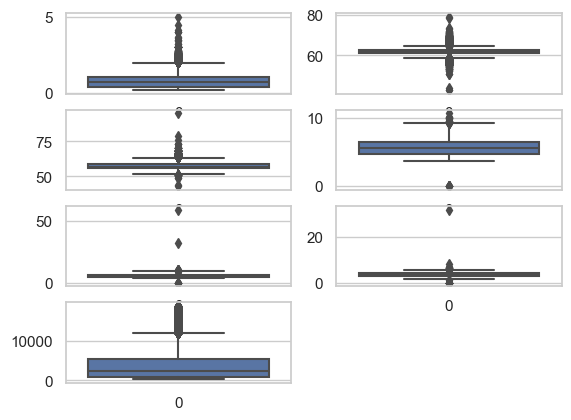

In [55]:
plt.figure(figsize=(14,14))
plt.subplots()
i=1
for feature in continuous_features:
    plt.subplot(4,2,i)
    sns.boxplot(diamonds[feature])
    i+=1

`There are outliers in the data, but these outliers might indicate unique or special diamonds.`

#### Test for hypothesis
Hypothesis:

Null Hypothesis (H0): There is no significant difference in the average price of diamonds among different cut categories.

Alternative Hypothesis (H1): There is a significant difference in the average price of diamonds among different cut categories

For this type of testing we use ANOVA (Analysis of variance).

In [ ]:
import scipy.stats as stats

# Group the data by cut and calculate the means
grouped_data = diamonds.groupby('cut')['price'].mean()

# Perform ANOVA
anova_result = stats.f_oneway(
    diamonds[diamonds['cut'] == 'Fair']['price'],
    diamonds[diamonds['cut'] == 'Good']['price'],
    diamonds[diamonds['cut'] == 'Very Good']['price'],
    diamonds[diamonds['cut'] == 'Premium']['price'],
    diamonds[diamonds['cut'] == 'Ideal']['price']
)

# Print the ANOVA results
print("ANOVA Results:")
print("F-statistic:", anova_result.statistic)
print("p-value:", anova_result.pvalue)

# Interpret the results - alpha- sig
alpha = 0.05
if anova_result.pvalue < alpha:
    print("Reject the null hypothesis. There is a significant difference in the average price among different cut categories.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in the average price among different cut categories.")
